In [1]:
import tensorflow as tf
import PIL
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (Dropout, Dense, Softmax)
from tensorflow.keras.applications import mobilenet as _mobilenet
import random
import os
import numpy as np
from PIL import Image
import networkx as nx
from sklearn.neighbors import NearestNeighbors
from IPython.display import Image as iImage
from IPython.display import display
import math

In [3]:
import numpy as np

In [4]:
colours = np.random.random([400, 3])

In [5]:
colGrid = colours.reshape([20,20,3])

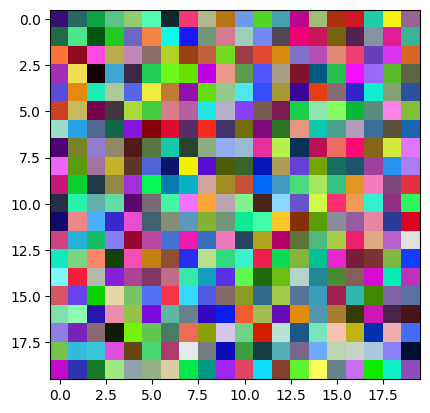

In [6]:
import matplotlib.pyplot as plt

fig = plt.figure()
plt.imshow(colGrid)
plt.show()

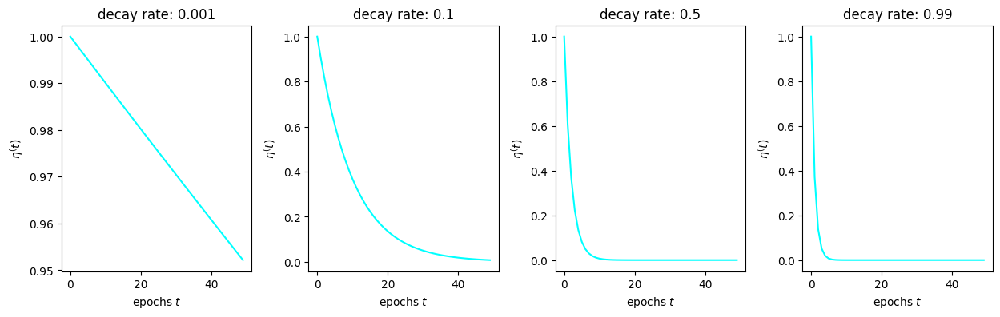

In [7]:
epochs = np.arange(0, 50)
lr_decay = [0.001, 0.1, 0.5, 0.99]
fig,ax = plt.subplots(nrows=1, ncols=4, figsize=(15,4))
plt_ind = np.arange(4) + 141
for decay, ind in zip(lr_decay, plt_ind):
    plt.subplot(ind)
    learn_rate = np.exp(-epochs * decay)
    plt.plot(epochs, learn_rate, c='cyan')
    plt.title('decay rate: ' + str(decay))
    plt.xlabel('epochs $t$')
    plt.ylabel('$\eta^(t)$')
fig.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

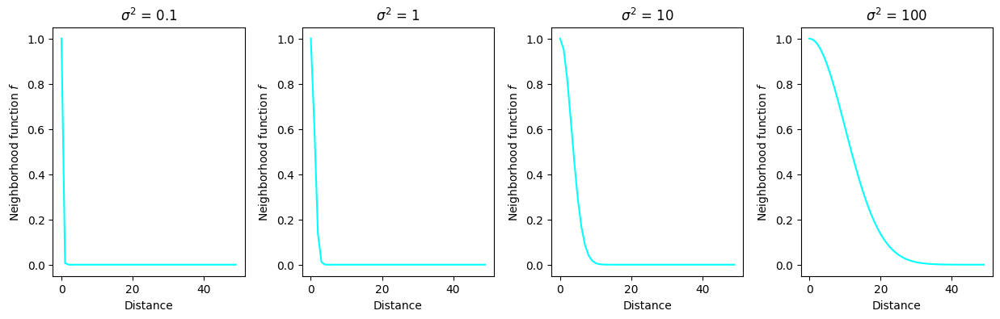

In [8]:
distance = np.arange(0, 50)
sigma_sq = [0.1, 1, 10, 100]
fig,ax = plt.subplots(nrows=1, ncols=4, figsize=(15,4))
plt_ind = np.arange(4) + 141
for s, ind in zip(sigma_sq, plt_ind):
    plt.subplot(ind)
    f = np.exp(-distance ** 2 / 2 / s)
    plt.plot(distance, f, c='cyan')
    plt.title('$\sigma^2$ = ' + str(s))
    plt.xlabel('Distance')
    plt.ylabel('Neighborhood function $f$')
fig.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

In [9]:
def normalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    normalised_p = (p-min_d)/(max_d - min_d)
    return normalised_p

In [10]:
def denormalise(train, p):
    min_d = np.min(train)
    max_d = np.max(train)
    denormalised_p = p * (max_d - min_d) + min_d
    return denormalised_p

In [11]:
# Return the (g,h) index of the BMU in the grid
def find_BMU(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argmin(distSq, axis=None), distSq.shape)

# Update the weights of the SOM cells when given a single training example
# and the model parameters along with BMU coordinates as a tuple
def update_weights(SOM, train_ex, learn_rate, radius_sq, 
                   BMU_coord, step=3):
    g, h = BMU_coord
    #if radius is close to zero then only BMU is changed
    if radius_sq < 1e-3:
        SOM[g,h,:] += learn_rate * (train_ex - SOM[g,h,:])
        return SOM
    # Change all cells in a small neighborhood of BMU
    for i in range(max(0, g-step), min(SOM.shape[0], g+step)):
        for j in range(max(0, h-step), min(SOM.shape[1], h+step)):
            dist_sq = np.square(i - g) + np.square(j - h)
            dist_func = np.exp(-dist_sq / 2 / radius_sq)
            SOM[i,j,:] += learn_rate * dist_func * (train_ex - SOM[i,j,:])   
    return SOM    

# Main routine for training an SOM. It requires an initialized SOM grid
# or a partially trained grid as parameter
def train_SOM(SOM, train_data, learn_rate = .1, radius_sq = 1, 
             lr_decay = .1, radius_decay = .1, epochs = 10):    
    learn_rate_0 = learn_rate
    radius_0 = radius_sq
    for epoch in np.arange(0, epochs):
        rand.shuffle(train_data)      
        for train_ex in train_data:
            g, h = find_BMU(SOM, train_ex)
            SOM = update_weights(SOM, train_ex, 
                                 learn_rate, radius_sq, (g,h))
        # Update learning rate and radius
        learn_rate = learn_rate_0 * np.exp(-epoch * lr_decay)
        radius_sq = radius_0 * np.exp(-epoch * radius_decay)            
    return SOM

In [12]:
# Dimension of the SOM grid
m = 10 
n = 10

# Number of training examples

n_x = 3000
rand = np.random.RandomState(0)

#Initiatlise training data
train_data = rand.randint(0, 255, (n_x, 3))

# Normalised training data
n_train_data = normalise(train_data, train_data)

In [13]:
# Initialize the SOM randomly
SOM = rand.uniform(0,1,(m,n,3))

# to show the original vector space:
oSOM = denormalise(train_data, SOM)

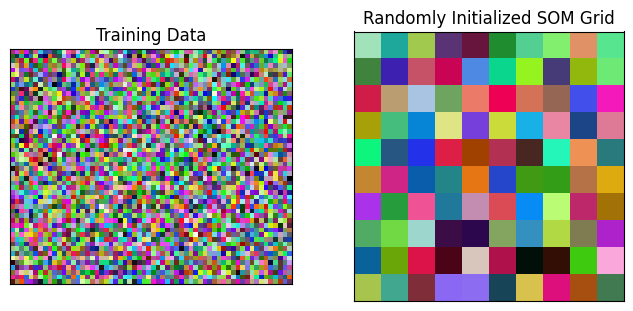

In [14]:
# Display both the training matrix and the SOM grid
fig, ax = plt.subplots(
    nrows=1, ncols=2, figsize=(8, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))
ax[0].imshow(train_data.reshape(50, 60, 3))
ax[0].title.set_text('Training Data')
ax[1].imshow(oSOM.astype(int))
ax[1].title.set_text('Randomly Initialized SOM Grid')

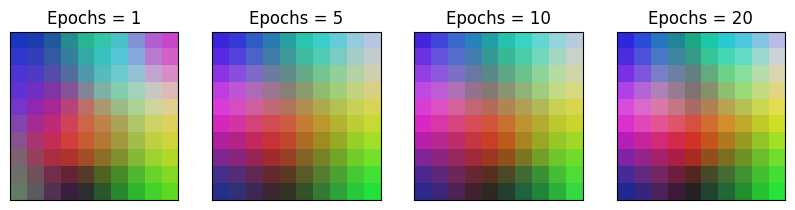

In [15]:
fig, ax = plt.subplots(
    nrows=1, ncols=4, figsize=(10, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))

total_epochs = 0

for epochs, i in zip([1, 4, 5, 10], range(0,4)):
    total_epochs += epochs
    SOM = train_SOM(SOM, n_train_data, epochs=epochs)
    
    oSOM = denormalise(train_data, SOM)    
    ax[i].imshow(oSOM.astype(int))
    ax[i].title.set_text('Epochs = ' + str(total_epochs))

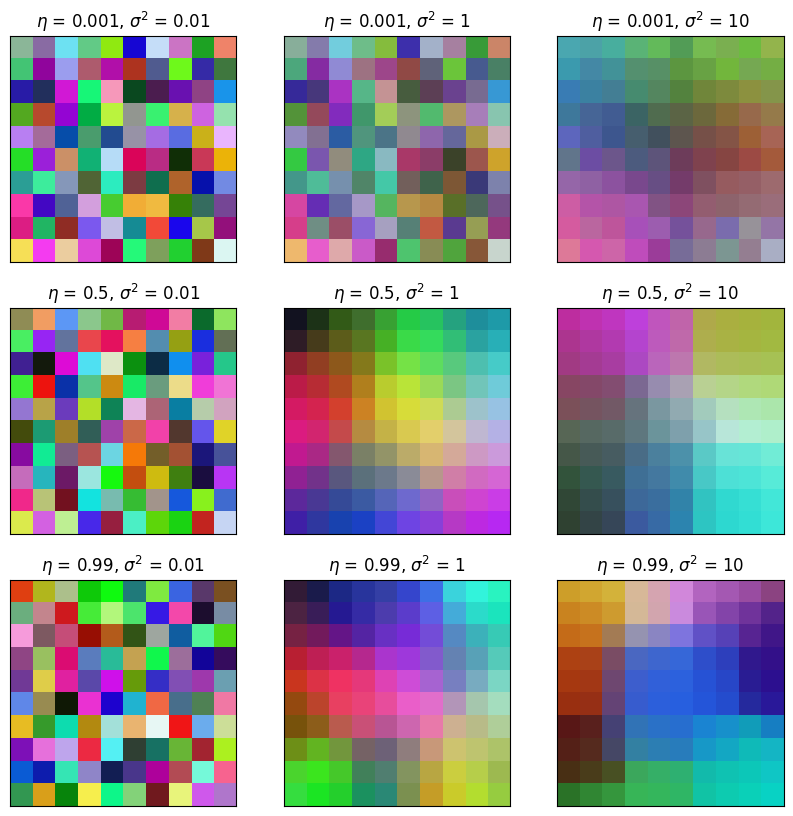

In [16]:
fig, ax = plt.subplots(
    nrows=3, ncols=3, figsize=(10, 10), 
    subplot_kw=dict(xticks=[], yticks=[]))

# Initialize the SOM randomly to the same state

for learn_rate, i in zip([0.001, 0.5, 0.99], [0, 1, 2]):
    for radius_sq, j in zip([0.01, 1, 10], [0, 1, 2]):
        rand = np.random.RandomState(0)
        SOM = rand.uniform(0, 1, (m, n, 3))        
        SOM = train_SOM(SOM, n_train_data, epochs = 5,
                        learn_rate = learn_rate, 
                        radius_sq = radius_sq)
        oSOM = denormalise(train_data, SOM)
        ax[i][j].imshow(oSOM.astype(int))
        ax[i][j].title.set_text('$\eta$ = ' + str(learn_rate) + 
                                ', $\sigma^2$ = ' + str(radius_sq))

In [20]:
import scipy
def calculateQE(SOM,data):
    sumSqDist = 0
    for d in data:
        g,h = find_BMU(SOM, d)
        v1 = SOM[g,h]
        v2 = d
        sumSqDist += scipy.spatial.distance.cdist([v1],[v2],'sqeuclidean')[0][0]
    QE = sumSqDist/len(data)
    return QE

In [21]:
# Return the (g,h) index of the BMU in the grid
def find_BMU_2(SOM,x):
    distSq = (np.square(SOM - x)).sum(axis=2)
    return np.unravel_index(np.argpartition(distSq, 2, axis=None)[2], distSq.shape)

In [22]:
def calculateTE(SOM,data):
    failed = 0
    for d in data:
        g1,h1 = find_BMU(SOM,d)
        g2,h2 = find_BMU_2(SOM,d)
        dist = scipy.spatial.distance.cityblock([g1,h1], [g2,h2])
        if dist>1:
            failed+=1
    return failed/len(data)

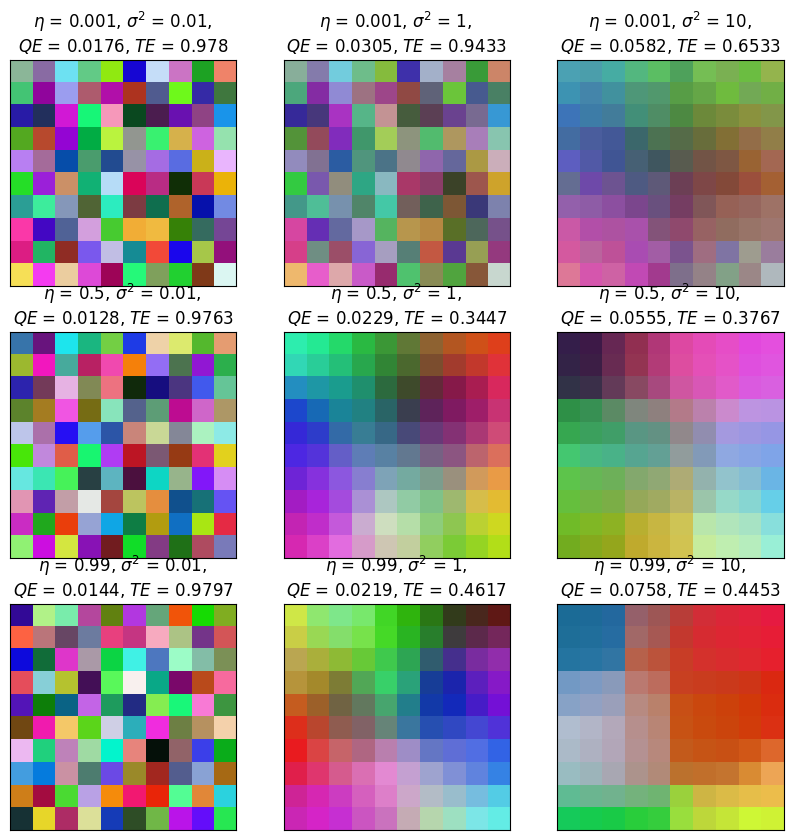

In [23]:
fig, ax = plt.subplots(
    nrows=3, ncols=3, figsize=(10, 10), 
    subplot_kw=dict(xticks=[], yticks=[]))

# Initialize the SOM randomly to the same state

SOMS = []

for learn_rate, i in zip([0.001, 0.5, 0.99], [0, 1, 2]):
    for radius_sq, j in zip([0.01, 1, 10], [0, 1, 2]):
        rand = np.random.RandomState(0)
        SOM = rand.uniform(0, 1, (m, n, 3))        
        SOM = train_SOM(SOM, n_train_data, epochs = 5,
                        learn_rate = learn_rate, 
                        radius_sq = radius_sq)
        QE = round(calculateQE(SOM, n_train_data), 4)
        TE = round(calculateTE(SOM, n_train_data), 4)
        SOMS.append(SOM)
        oSOM = denormalise(train_data, SOM)
        ax[i][j].imshow(oSOM.astype(int))
        ax[i][j].title.set_text('$\eta$ = ' + str(learn_rate) + 
                                ', $\sigma^2$ = ' + str(radius_sq) + 
                               ', \n$QE$ = ' + str(QE) + 
                               ', $TE$ = ' + str(TE))

In [24]:
import sklearn

def euclidean(a, b):
    return np.linalg.norm(a-b)

def u_matrix(lattice):
    """Builds a U-matrix on top of the trained lattice.

        Parameters
        ---
        lattice : list

            The SOM generated lattice

        Returns
        ---
        The lattice of the shape (R,C):

        R - number of rows; C - number of columns;
        """
    X, Y, Z = lattice.shape
    u_values = np.empty((X,Y), dtype=np.float64)

    for y in range(Y):
        for x in range(X):
            current = lattice[x,y]
            dist = 0
            num_neigh = 0
            # left
            if x-1 >= 0:
                #middle
                vec = lattice[x-1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #sup
                    vec = lattice[x-1, y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < Y:
                    # down
                    vec = lattice[x-1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            # middle
            if y - 1 >= 0:
                # up
                vec = lattice[x,y-1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # down
            if y + 1 < Y:
                vec = lattice[x,y+1]
                dist += euclidean(current, vec)
                num_neigh += 1
            # right
            if x + 1 < X:
                # middle
                vec = lattice[x+1,y]
                dist += euclidean(current, vec)
                num_neigh += 1
                if y - 1 >= 0:
                    #up
                    vec = lattice[x+1,y-1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
                if y + 1 < lattice.shape[1]:
                    # down
                    vec = lattice[x+1,y+1]
                    dist += euclidean(current, vec)
                    num_neigh += 1
            u_values[x,y] = dist / num_neigh
    u_values = (u_values - 1) * -1
    return u_values

In [25]:
u_matrix(SOM)

array([[0.98037979, 0.97320103, 0.775143  , 0.74943009, 0.8673728 ,
        0.86561556, 0.9342193 , 0.96605465, 0.96535231, 0.94980623],
       [0.9704369 , 0.96347709, 0.76469664, 0.72550483, 0.86269058,
        0.88236284, 0.9397147 , 0.9641002 , 0.96218483, 0.95805025],
       [0.82708879, 0.82964535, 0.67160446, 0.70273352, 0.84451809,
        0.88261833, 0.93539374, 0.93925648, 0.93031501, 0.9209719 ],
       [0.80379342, 0.81059524, 0.72637585, 0.75687811, 0.80927276,
        0.86067007, 0.93828693, 0.92735625, 0.91571344, 0.91603255],
       [0.88643102, 0.89627338, 0.83407666, 0.8392893 , 0.80037752,
        0.82625195, 0.95269939, 0.95515649, 0.9445124 , 0.95193984],
       [0.89402855, 0.90710382, 0.87174002, 0.87410371, 0.79784443,
        0.81880004, 0.96017632, 0.95338839, 0.91787284, 0.88960347],
       [0.94394086, 0.93662222, 0.89356153, 0.88714552, 0.80919211,
        0.79697196, 0.91969624, 0.89358152, 0.8338672 , 0.79563312],
       [0.84525551, 0.85430318, 0.8302885

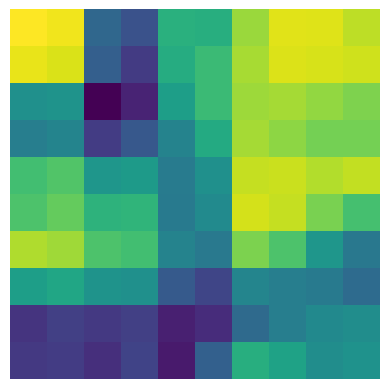

In [26]:
fig = plt.figure()
plt.imshow(u_matrix(SOM))
plt.axis('off')
plt.show()

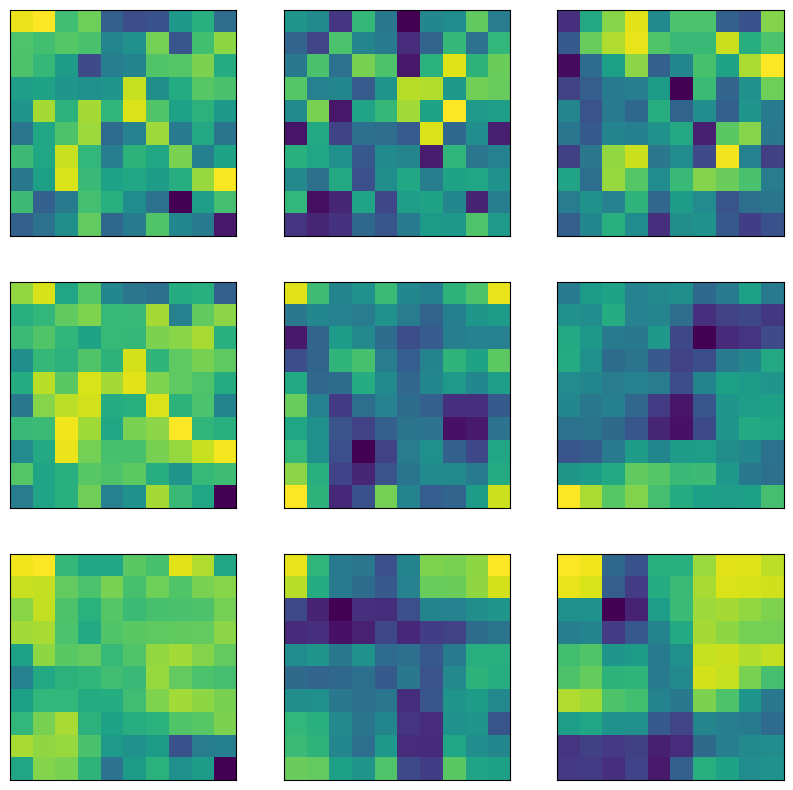

In [27]:
fig, ax = plt.subplots(
    nrows=3, ncols=3, figsize=(10, 10), 
    subplot_kw=dict(xticks=[], yticks=[]))

# Initialize the SOM randomly to the same state

for s, n in zip(SOMS, range(len(SOMS))):
        QE = round(calculateQE(s, n_train_data), 4)
        TE = round(calculateTE(s, n_train_data), 4)
        
        i = n%3
        j = n//3
        
        ax[i][j].imshow(u_matrix(s))

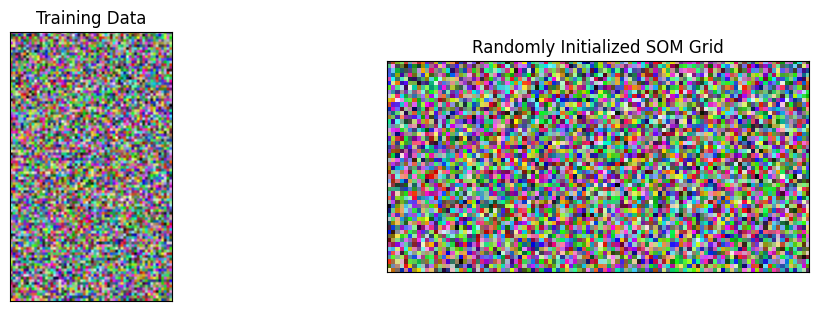

In [28]:
# Dimensions of the SOM grid
m = 50
n = 100
# Number of training examples
n_x = 6000
rand = np.random.RandomState(0)
# Initialize the training data
train_data = rand.randint(0, 255, (n_x, 3))

# Normalised Training Data
n_train_data = normalise(train_data, train_data)

# Initialize the SOM randomly
SOM = rand.uniform(0, 1, (m, n, 3))

# to show the SOM in the original vector space:
oSOM = denormalise(train_data, SOM)

# Display both the training matrix and the SOM grid
fig, ax = plt.subplots(
    nrows=1, ncols=2, figsize=(12, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))
ax[0].imshow(train_data.reshape(100, 60, 3))
ax[0].title.set_text('Training Data')
ax[1].imshow(oSOM.astype(int))
ax[1].title.set_text('Randomly Initialized SOM Grid')

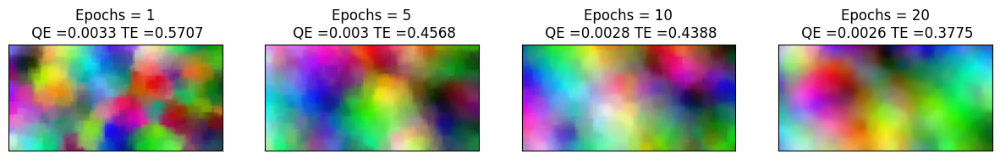

In [29]:
fig, ax = plt.subplots(
    nrows=1, ncols=4, figsize=(15, 5), 
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
for epochs, i in zip([1, 4, 5, 10], range(0,4)):
    total_epochs += epochs
    SOM = train_SOM(SOM, n_train_data, learn_rate=0.5, radius_sq=10, epochs=epochs)
    
    QE = round(calculateQE(SOM, n_train_data), 4)
    TE = round(calculateTE(SOM, n_train_data), 4)
    
    oSOM = denormalise(train_data, SOM)    
    ax[i].imshow(oSOM.astype(int))
    ax[i].title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

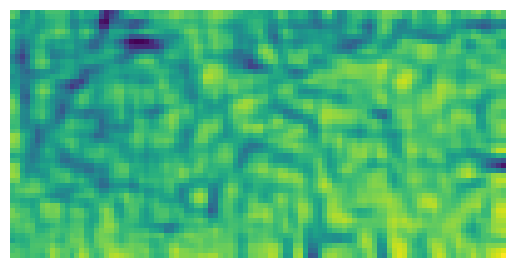

In [30]:
fig = plt.figure()
plt.imshow(u_matrix(SOM))
plt.axis('off')
plt.show()

In [31]:
def activate(train_data, SOM, p):
    normalP = normalise(train_data, p)
    activatedSOM = np.array([[euclidean(normalP, c) for c in r] for r in SOM])
    normalisedActivatedSOM = normalise(activatedSOM, activatedSOM)
    activatedSOM = (normalisedActivatedSOM -1)*(-1)
    return activatedSOM

In [32]:
activatedSOM = activate(train_data, SOM, [255, 0, 0])

In [33]:
activatedSOM

array([[0.30953204, 0.30192981, 0.29029684, ..., 0.28481742, 0.28817857,
        0.29270409],
       [0.30566163, 0.29711779, 0.28574417, ..., 0.26232121, 0.26248855,
        0.26417831],
       [0.30083785, 0.29198701, 0.28178621, ..., 0.23257151, 0.23768004,
        0.23440884],
       ...,
       [0.21408128, 0.2093037 , 0.20470981, ..., 0.44895433, 0.44958622,
        0.4481209 ],
       [0.21831502, 0.21731262, 0.21549417, ..., 0.45843191, 0.4575685 ,
        0.45601758],
       [0.22157331, 0.22052262, 0.21852648, ..., 0.46280133, 0.46255929,
        0.45962454]])

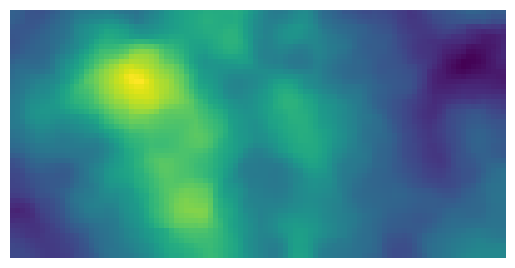

In [34]:
fig = plt.figure()
plt.imshow(activatedSOM)
plt.axis('off')
plt.show()

# Homework

### 1.Train a SOM with your own collection of images. Also play around with the size of the SOM and the other training parameters to find a good setting

In [35]:
def load_image(img_file, target_size=(224,224)):
    X = np.zeros((1, *target_size, 3))
    X[0, ] = np.asarray(tf.keras.preprocessing.image.load_img(
        img_file, 
        target_size=target_size)
    )
    X = tf.keras.applications.mobilenet.preprocess_input(X)
    return X

def ensure_folder_exists(folder):
    if not os.path.exists(folder):
        os.makedirs(folder)

In [36]:
def processImage(imagePath, model):
    im = load_image(imagePath)
    f = model.predict(im)[0]
    return f

In [37]:
model = tf.keras.applications.mobilenet.MobileNet(
# The 3 is the three dimensions of the input: r,g,b.
  input_shape=(224, 224, 3), 
  include_top=False, 
  pooling='avg'
)

In [39]:
import os
import re

# 替换 'testimage' 为实际的文件夹路径
folder_path = 'testimage'
momaFiles = os.listdir(folder_path)
#rank?
momaFiles.sort(key=lambda x: int(re.search(r'\d+', x).group()))

# 移除可能的隐藏文件，根据实际情况调整
if '.DS_Store' in momaFiles:
    momaFiles.remove('.DS_Store')

# 限制文件名列表的长度为前 200 个
momaFiles = momaFiles[:200]

# 打印文件名列表
print(momaFiles)


['Fiesta de Santa Marta de Ribarteme_image0.jpg', 'Fiesta de Santa Marta de Ribarteme_image1.jpg', 'Fiesta de Santa Marta de Ribarteme_image2.jpg', 'Fiesta de Santa Marta de Ribarteme_image3.jpg', 'Fiesta de Santa Marta de Ribarteme_image4.jpg', 'Fiesta de Santa Marta de Ribarteme_image5.jpg', 'Fiesta de Santa Marta de Ribarteme_image6.jpg', 'Fiesta de Santa Marta de Ribarteme_image7.jpg', 'Fiesta de Santa Marta de Ribarteme_image8.jpg', 'Fiesta de Santa Marta de Ribarteme_image9.jpg', 'Fiesta de Santa Marta de Ribarteme_image10.jpg', 'Fiesta de Santa Marta de Ribarteme_image11.jpg', 'Fiesta de Santa Marta de Ribarteme_image12.jpg', 'Fiesta de Santa Marta de Ribarteme_image13.jpg', 'Fiesta de Santa Marta de Ribarteme_image14.jpg', 'Fiesta de Santa Marta de Ribarteme_image15.jpg', 'Fiesta de Santa Marta de Ribarteme_image16.jpg', 'Fiesta de Santa Marta de Ribarteme_image17.jpg', 'Fiesta de Santa Marta de Ribarteme_image18.jpg', 'Fiesta de Santa Marta de Ribarteme_image19.jpg', 'Fiesta d

In [41]:
features = []
for m in momaFiles:
    path = os.path.join('testimage', m)
    f = processImage(path, model)
    features.append(f)

1/1 [==============================] - 0s 28ms/step


1/1 [==============================] - 0s 26ms/step


In [42]:
featureImagePairs = []
for i in range(len(features)):
    featureImage = {}
    featureImage['image'] = momaFiles[i]
    featureImage['feature'] = features[i]
    featureImagePairs.append(featureImage)

In [43]:
featureImagePairs[0]

{'image': 'Fiesta de Santa Marta de Ribarteme_image0.jpg',
 'feature': array([1.3384593 , 1.1768051 , 0.10379375, ..., 0.60719204, 0.14931001,
        0.32777965], dtype=float32)}

In [61]:
# Dimensions of the SOM grid
m = 10
n = 10
# Number of training examples
n_x = 200
rand = np.random.RandomState(0)
# Initialize the training data
train_data = features

# Normalised Training Data
n_train_data = normalise(train_data, train_data)

# Initialize the SOM randomly
SOM = rand.uniform(0, 1, (m, n, len(train_data[0])))

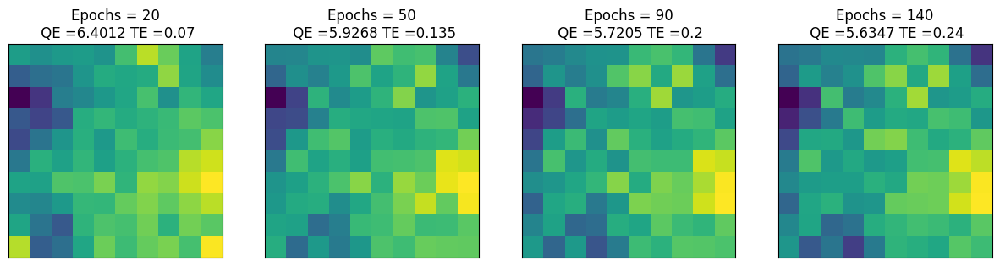

In [84]:
fig, ax = plt.subplots(
    nrows=1, ncols=4, figsize=(15, 3.5), 
    subplot_kw=dict(xticks=[], yticks=[]))
total_epochs = 0
SOMS = []
for epochs, i in zip([20, 30, 40, 50], range(0,4)):
    total_epochs += epochs
    SOM = train_SOM(SOM, n_train_data, learn_rate = .1, radius_sq = 2, epochs = epochs)
    SOMS.append(SOM)
    QE = round(calculateQE(SOM, n_train_data), 4)
    TE = round(calculateTE(SOM, n_train_data), 4)
    
    ax[i].imshow(u_matrix(SOM))
    ax[i].title.set_text('Epochs = ' + str(total_epochs) + '\n QE =' + str(QE) + ' TE =' + str(TE))

In [85]:
SOM = SOMS[-1]

In [86]:
SOM[0][0]

array([0.15711627, 0.08904961, 0.12994363, ..., 0.07758939, 0.09514025,
       0.14517796])

In [87]:
find_BMU(SOM, normalise(train_data,featureImagePairs[1]['feature']))

(5, 4)

In [88]:
SOMimages = []
for i in range(len(SOM)):
    row = []
    for j in range(len(SOM[0])):
        row.append([])
    SOMimages.append(row)

In [89]:
SOMimages

[[[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []],
 [[], [], [], [], [], [], [], [], [], []]]

In [90]:
for fi in featureImagePairs:
    g,h = find_BMU(SOM, normalise(train_data, fi['feature']))
    SOMimages[g][h].append(fi)

In [91]:
SOMimages[0][0]

[{'image': 'Fiesta de Santa Marta de Ribarteme_image56.jpg',
  'feature': array([1.1572059 , 0.06112734, 0.5635518 , ..., 0.8508253 , 0.        ,
         0.        ], dtype=float32)},
 {'image': 'Fiesta de Santa Marta de Ribarteme_image59.jpg',
  'feature': array([0.22470608, 0.02326236, 1.4699296 , ..., 0.        , 1.2359024 ,
         0.21599859], dtype=float32)},
 {'image': 'Fiesta de Santa Marta de Ribarteme_image119.jpg',
  'feature': array([1.3387196 , 1.0612129 , 0.06238145, ..., 0.1738198 , 0.66531074,
         0.24759184], dtype=float32)},
 {'image': 'Fiesta de Santa Marta de Ribarteme_image184.jpg',
  'feature': array([1.2319353, 1.1593491, 1.4125912, ..., 0.7823374, 0.       ,
         2.925146 ], dtype=float32)}]

In [92]:
[[len(c) for c in r] for r in SOMimages]

[[4, 3, 4, 3, 4, 2, 3, 4, 3, 3],
 [1, 0, 1, 1, 0, 0, 3, 0, 1, 3],
 [4, 2, 0, 3, 3, 1, 0, 2, 1, 2],
 [3, 2, 4, 1, 3, 4, 3, 1, 1, 5],
 [3, 0, 1, 1, 0, 0, 1, 2, 2, 2],
 [4, 0, 3, 3, 2, 2, 1, 2, 0, 1],
 [2, 1, 3, 2, 1, 2, 1, 3, 2, 6],
 [3, 0, 0, 2, 3, 1, 1, 1, 0, 0],
 [3, 0, 1, 3, 1, 1, 2, 2, 1, 3],
 [5, 5, 1, 2, 3, 1, 4, 3, 1, 6]]

In [93]:
from scipy import spatial

imageGrid = []
for g in range(len(SOMimages)):
    row = SOMimages[g]
    for h in range(len(row)):
        cell = row[h]
        if len(cell) > 0:
            imageGrid.append(cell[0]['image'])
        else:
            imageGrid.append('white.png')

In [94]:
def img_reshape(img):
    img = Image.open('testimage/'+img).convert('RGB')
    img = img.resize((100,100))
    img = np.asarray(img)
    return img

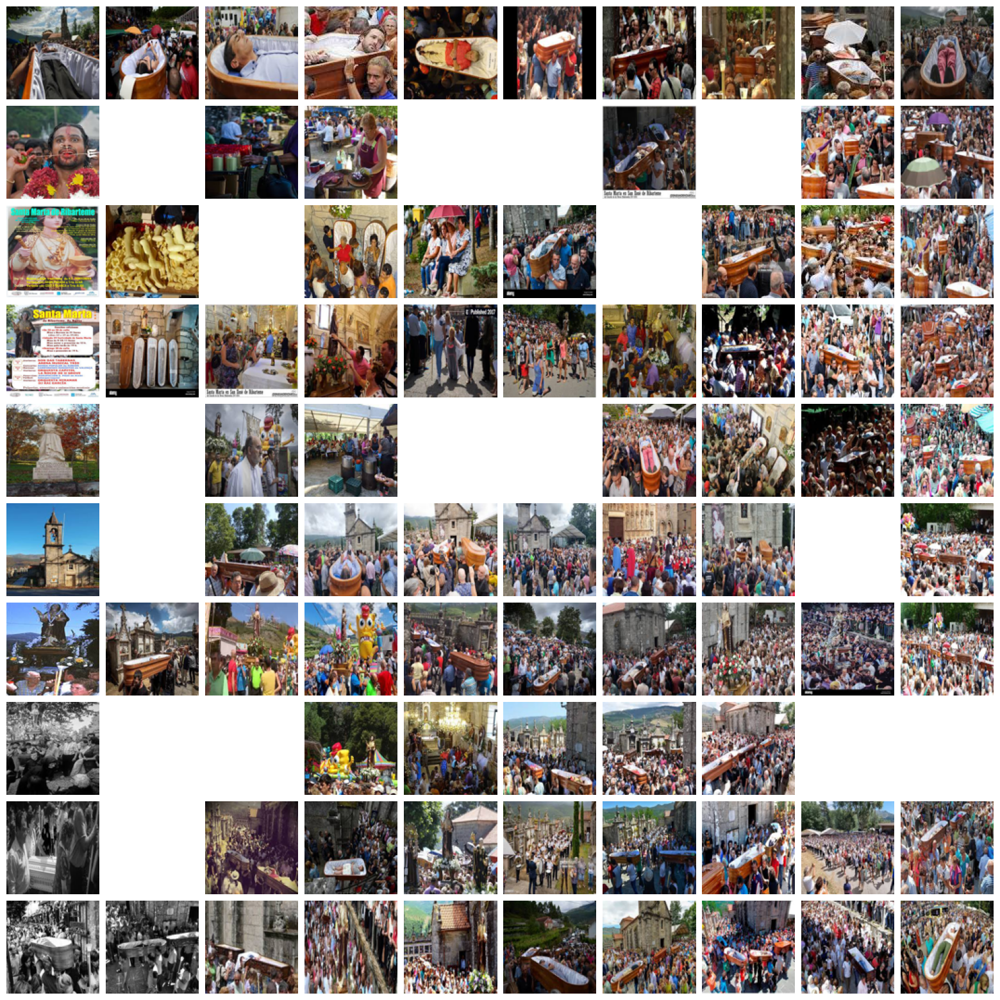

In [95]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(20., 20.))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

In [96]:
featureImagePairs[0]

{'image': 'Fiesta de Santa Marta de Ribarteme_image0.jpg',
 'feature': array([1.3384593 , 1.1768051 , 0.10379375, ..., 0.60719204, 0.14931001,
        0.32777965], dtype=float32)}

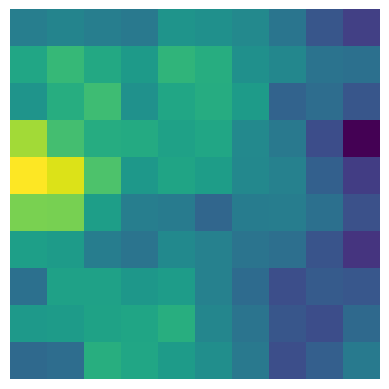

In [97]:
activatedSOM = activate(train_data, SOM, normalise(train_data,featureImagePairs[0]['feature']))
fig = plt.figure()
plt.imshow(activatedSOM)
plt.axis('off')
plt.show()

### 2.Write a function with which you can save a trained som using pickle

In [98]:
import pickle

def save_som(som, filename):
    with open(filename, 'wb') as f:
        pickle.dump(som, f)

def load_som(filename):
    with open(filename, 'rb') as f:
        som = pickle.load(f)
    return som


In [78]:
# SOMS is a list containing your trained SOMs
for idx, som in enumerate(SOMS):
    save_som(som, f'saved_som_{idx + 1}.pkl')

### 3.Write a function to load a saved som

In [79]:
# Load a saved SOM
loaded_som = load_som('saved_som_1.pkl')

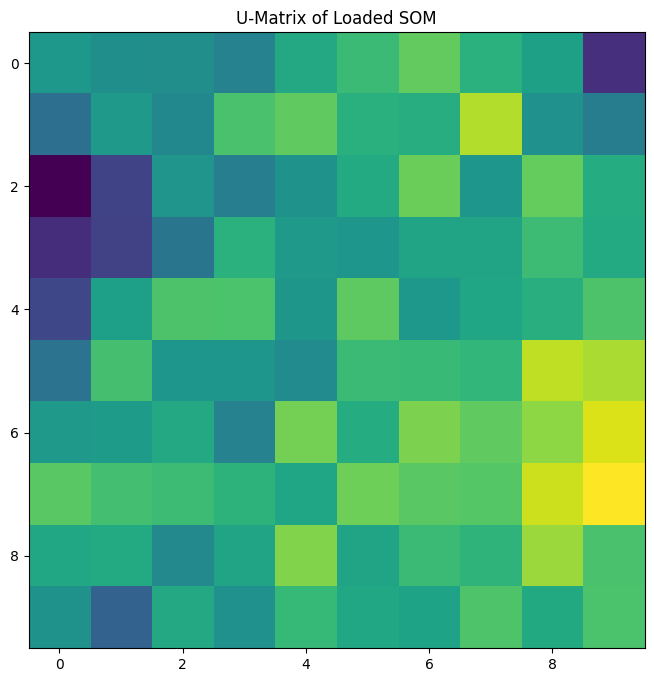

In [80]:
fig, ax = plt.subplots(figsize=(8, 8))

# Visualize the U-matrix of the SOM
ax.imshow(u_matrix(loaded_som))
ax.set_title('U-Matrix of Loaded SOM')
plt.show()

### 4.When filling the SOM with images, make sure that the images that are displayed are in fact the images that are closest to the SOM vector of that particular cell (in the current notebook this is a random image from the list of images in that cell)

In [105]:
from scipy import spatial

imageGrid = []
for g in range(len(SOMimages)):
    row = SOMimages[g]
    for h in range(len(row)):
        cell = row[h]
        if len(cell) > 0:
            #Find the image closest to the SOM vector
            closest_image = min(cell, key=lambda x: spatial.distance.cosine(x['feature'], SOM[g][h]))
            imageGrid.append(closest_image['image'])
        else:
            imageGrid.append('white.png')


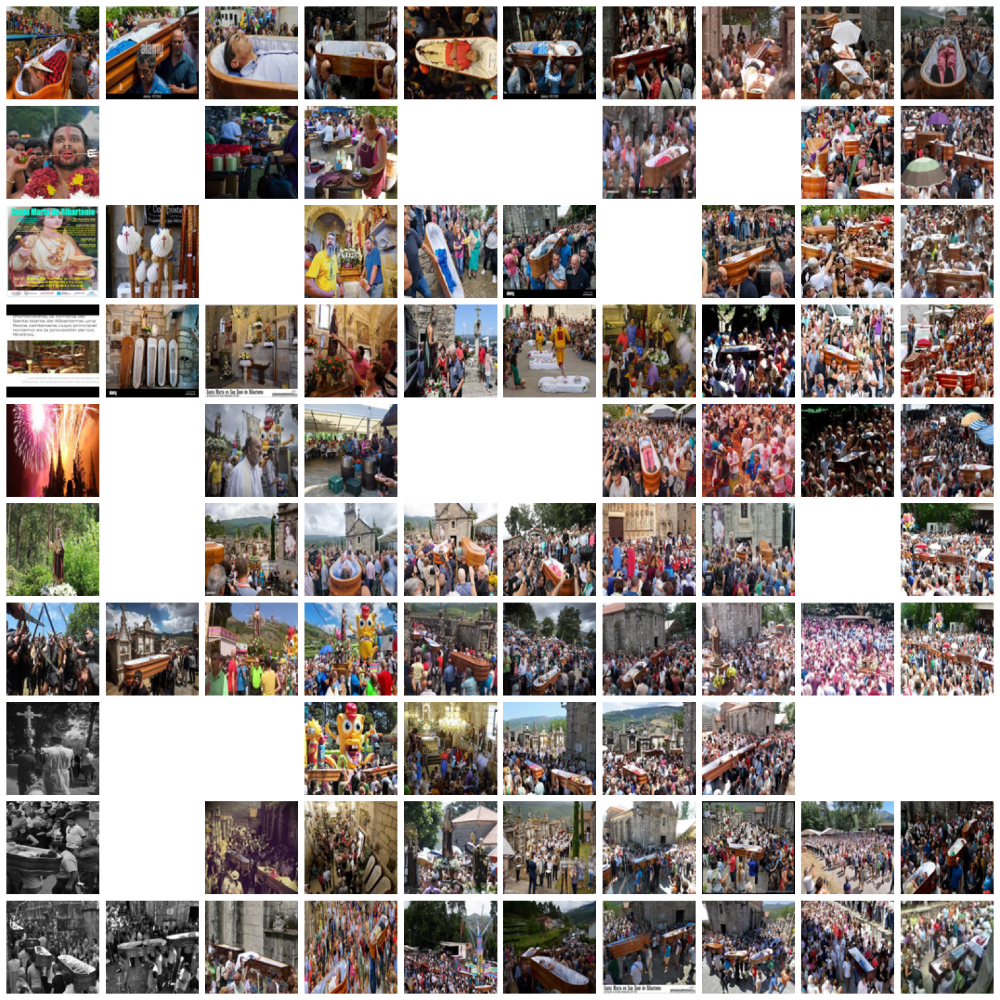

In [106]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

img_arr = []
for image in imageGrid:
    img_arr.append(img_reshape(image))

fig = plt.figure(figsize=(20., 20.))
grid = ImageGrid(fig, 111, 
                 nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes
                 )

for ax, im in zip(grid, img_arr):
    ax.imshow(im)
    ax.axis('off')
plt.show()

### 5.Write a function that returns a grid of images where each image is the closest image from the training data set to that cell in the SOM.

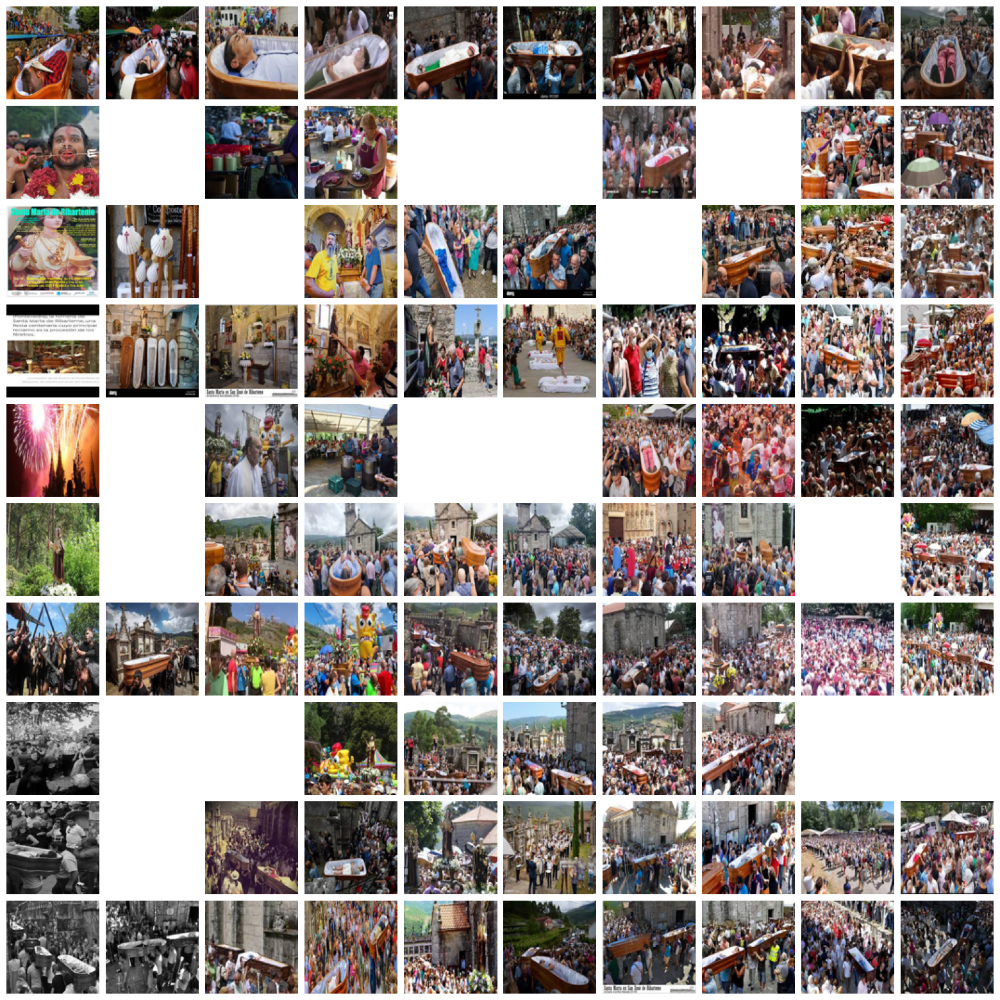

In [110]:
from scipy import spatial
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np

def create_image_grid(SOMimages, SOM, img_reshape):
    imageGrid = []

    for g in range(len(SOMimages)):
        row = SOMimages[g]
        for h in range(len(row)):
            cell = row[h]
            if len(cell) > 0:
                # Find the image closest to the SOM vector
                closest_image = min(cell, key=lambda x: spatial.distance.cosine(x['feature'], SOM[g][h]))
                imageGrid.append(closest_image['image'])
            else:
                imageGrid.append('white.png')

    img_arr = []
    for image in imageGrid:
        img_arr.append(img_reshape(image))

    fig = plt.figure(figsize=(20., 20.))
    grid = ImageGrid(fig, 111, 
                     nrows_ncols=(10, 10),  # creates 2x2 grid of axes
                     axes_pad=0.1,  # pad between axes
                     )

    for ax, im in zip(grid, img_arr):
        ax.imshow(im)
        ax.axis('off')

    plt.show()

# Example usage:
create_image_grid(SOMimages, loaded_som, img_reshape)


### 6.Make a function to visualise a uMatrix using your own colour gradient.

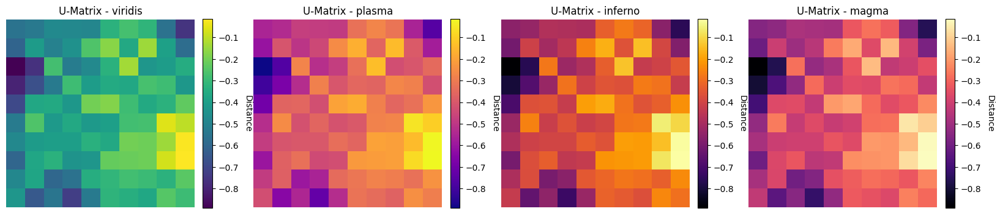

In [114]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_umatrix_with_gradients(SOM):
    """
    Visualizes the uMatrix of a SOM using multiple color gradients.

    Parameters:
    - SOM (numpy array): The SOM matrix.

    Returns:
    - None (displays the plots).
    """
    gradients = ['viridis', 'plasma', 'inferno', 'magma']

    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    for i, gradient in enumerate(gradients):
        umatrix = u_matrix(SOM)
        ax = axs[i]
        im = ax.imshow(umatrix, cmap=gradient)
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label('Distance', rotation=270, labelpad=15)
        ax.set_title(f'U-Matrix - {gradient}')
        ax.axis('off')

    plt.show()


visualize_umatrix_with_gradients(SOM)


### 7.Train a SOM with a different way of vectorising a dataset, this could be text using TF-IDF, or any other alternative which which you can encode a dataset into a numerical vector. The vectors should have at least 4 dimensions.


C:\Users\wutai\AppData\Local\Temp\ipykernel_74796\820232620.py:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


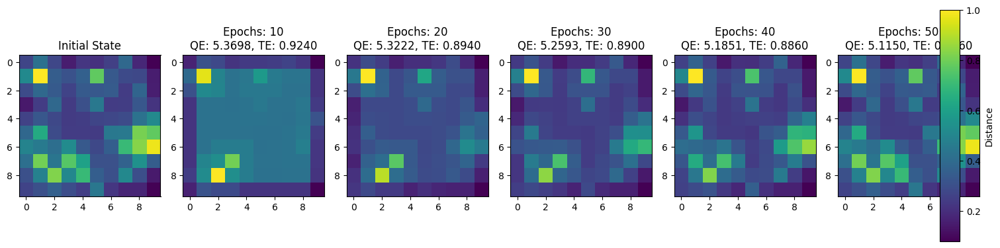

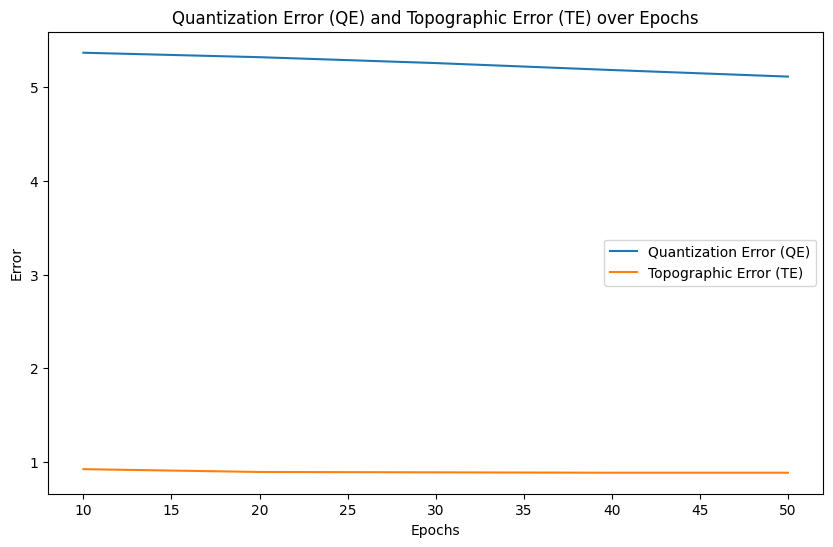

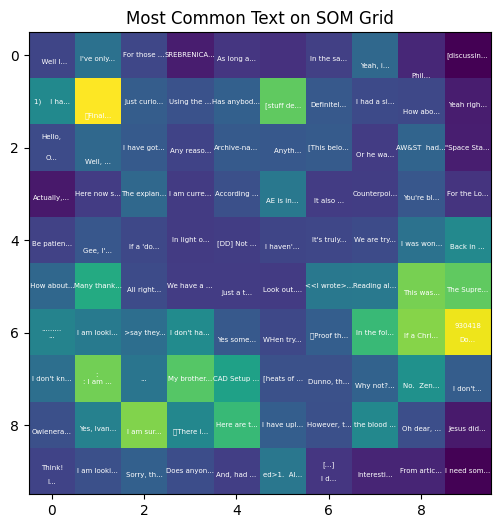

In [123]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.datasets import fetch_20newsgroups
import numpy as np
from minisom import MiniSom
import matplotlib.pyplot as plt

# Load a smaller subset of the 20 newsgroups dataset
newsgroups = fetch_20newsgroups(subset='all', remove=('headers', 'footers', 'quotes'), shuffle=True, random_state=42)

# Extract the text documents
texts = newsgroups.data[:500]  # Use a smaller subset

# TF-IDF vectorization
vectorizer = TfidfVectorizer()
tfidf_matrix = vectorizer.fit_transform(texts)

# Convert the TF-IDF matrix to a NumPy array
tfidf_array = tfidf_matrix.toarray()

# Normalize the data
def normalize_data(data):
    return (data - np.min(data, axis=0)) / (np.max(data, axis=0) - np.min(data, axis=0))

normalized_data = normalize_data(tfidf_array)

# Dimensions of the SOM grid
m = 10
n = 10

# Number of training examples
n_x = len(normalized_data)

# Initialize the SOM randomly
som = MiniSom(m, n, len(normalized_data[0]), sigma=0.3, learning_rate=0.5, random_seed=42)

# Train the SOM with variable epochs
epochs_list = [10, 20, 30, 40, 50]  # Adjust the epochs as needed
qe_values = []
te_values = []

fig, axs = plt.subplots(nrows=1, ncols=len(epochs_list) + 1, figsize=(15, 5))

# Plot the initial state (epochs = 0)
u_matrix = som.distance_map()
axs[0].imshow(u_matrix, cmap='viridis', interpolation='none')
axs[0].set_title('Initial State')

# Train the SOM for each set of epochs
for i, epochs in enumerate(epochs_list):
    som.train_batch(normalized_data, num_iteration=epochs)
    
    # Calculate QE and TE
    qe = som.quantization_error(normalized_data)
    te = som.topographic_error(normalized_data)
    
    qe_values.append(qe)
    te_values.append(te)
    
    # Visualize the u-matrix
    u_matrix = som.distance_map()
    axs[i + 1].imshow(u_matrix, cmap='viridis', interpolation='none')
    axs[i + 1].set_title(f'Epochs: {epochs}\nQE: {qe:.4f}, TE: {te:.4f}')

# Add color bar
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
fig.colorbar(axs[0].imshow(u_matrix, cmap='viridis', interpolation='none'), cax=cbar_ax, label='Distance')

plt.tight_layout()
plt.show()

# Plot QE and TE over epochs
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(epochs_list, qe_values, label='Quantization Error (QE)')
ax.plot(epochs_list, te_values, label='Topographic Error (TE)')

ax.set_xlabel('Epochs')
ax.set_ylabel('Error')
ax.legend()

plt.title('Quantization Error (QE) and Topographic Error (TE) over Epochs')
plt.show()

# Use the first set of epochs (e.g., epochs=10) to project text onto the SOM
som.train_batch(normalized_data, num_iteration=epochs_list[0])

from collections import Counter

# Assuming 'bmu_idx' contains the BMU indices for each text document
# Create a mapping of BMU indices to corresponding texts
bmu_text_mapping = {}
for i, txt in enumerate(texts):
    bmu = tuple(bmu_idx[i])
    if bmu in bmu_text_mapping:
        bmu_text_mapping[bmu].append(txt)
    else:
        bmu_text_mapping[bmu] = [txt]

# Find the most common text for each BMU
most_common_text_per_bmu = {bmu: Counter(texts).most_common(1)[0][0] for bmu, texts in bmu_text_mapping.items()}

# Visualize the text documents on the SOM grid with the most common text
fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(u_matrix, cmap='viridis', interpolation='none')

for bmu, most_common_text in most_common_text_per_bmu.items():
    ax.text(bmu[1], bmu[0], f'{most_common_text[:10]}...', color='white', ha='center', va='center', fontsize=5)

ax.set_title('Most Common Text on SOM Grid')
plt.show()
